In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import os
from tensorflow.keras.preprocessing import image
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [ ]:
import os

#go to kaggle --> settings-->API Token--> download json file to get username and key

os.environ["KAGGLE_USERNAME"]="veronica23"
os.environ["KAGGLE_KEY"]="802f7ad5eef8edfad5f46c06766ce973"

! kaggle competitions download -c gan-getting-started
#after download we put url of our dataset

 99% 364M/367M [00:11<00:00, 25.1MB/s]
100% 367M/367M [00:11<00:00, 32.5MB/s]


In [ ]:
!unzip gan-getting-started.zip

Streaming output truncated to the last 5000 lines.
  inflating: photo_jpg/46e84039a1.jpg  
  inflating: photo_jpg/46f391abec.jpg  
  inflating: photo_jpg/46f5ef1042.jpg  
  inflating: photo_jpg/4706619607.jpg  
  inflating: photo_jpg/4707b03a08.jpg  
  inflating: photo_jpg/47100a9939.jpg  
  inflating: photo_jpg/471f4755b9.jpg  
  inflating: photo_jpg/472b351bc4.jpg  
  inflating: photo_jpg/472d5ac100.jpg  
  inflating: photo_jpg/4758e5dd4c.jpg  
  inflating: photo_jpg/4762bb79ef.jpg  
  inflating: photo_jpg/4778b13518.jpg  
  inflating: photo_jpg/4787b82d37.jpg  
  inflating: photo_jpg/478e07feaa.jpg  
  inflating: photo_jpg/478eb12a82.jpg  
  inflating: photo_jpg/479698b371.jpg  
  inflating: photo_jpg/4796d67f61.jpg  
  inflating: photo_jpg/47aad493bd.jpg  
  inflating: photo_jpg/47ae0edd23.jpg  
  inflating: photo_jpg/47b94957ff.jpg  
  inflating: photo_jpg/47bb43fe3e.jpg  
  inflating: photo_jpg/47bb59d449.jpg  
  inflating: photo_jpg/47d391d94b.jpg  
  inflating: photo_jpg/47df26

In [ ]:
monet_tfrec_path = os.path.join('/content/monet_tfrec')
photo_tfrec_path = os.path.join('/content/photo_tfrec')

In [ ]:
feature_description = {
    'image': tf.io.FixedLenFeature([], tf.string),
}

In [ ]:
def _parse_function(example_proto):
    # Parse the input `tf.train.Example` proto using the feature description:
    parsed_example = tf.io.parse_single_example(example_proto, feature_description)

    # Decode the image and reshape it:
    image = tf.io.decode_jpeg(parsed_example['image'])
    image = tf.image.resize(image, [256, 256])  # Resize to desired size
    image = (image / 127.5) - 1  # Normalize to [-1, 1]

    return image

In [ ]:
## Gathering the tfrec Monet data:
monet_dataset = tf.data.Dataset.list_files(monet_tfrec_path + '/*.tfrec')
monet_dataset = monet_dataset.interleave(tf.data.TFRecordDataset, cycle_length=4)
monet_dataset = monet_dataset.map(_parse_function)

In [ ]:
## Gathering the tfrec Photos:
photo_dataset = tf.data.Dataset.list_files(photo_tfrec_path + '/*.tfrec')
photo_dataset = photo_dataset.interleave(tf.data.TFRecordDataset, cycle_length=4)
photo_dataset = photo_dataset.map(_parse_function)

In [ ]:
BUFFER_SIZE = 400
BATCH_SIZE = 32
monet_dataset = monet_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
photo_dataset = photo_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

monet_dataset, photo_dataset

(<_PrefetchDataset element_spec=TensorSpec(shape=(None, 256, 256, None), dtype=tf.float32, name=None)>,
 <_PrefetchDataset element_spec=TensorSpec(shape=(None, 256, 256, None), dtype=tf.float32, name=None)>)

In [ ]:
## Generator:
def make_generator_model():
    # Reshaping the images
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    # Encoder
    down1 = tf.keras.layers.Conv2D(64, (4, 4), strides=2, padding='same', activation='relu')(inputs)
    down2 = tf.keras.layers.Conv2D(128, (4, 4), strides=2, padding='same', activation='relu')(down1)
    down3 = tf.keras.layers.Conv2D(256, (4, 4), strides=2, padding='same', activation='relu')(down2)

    # Decoder
    up1 = tf.keras.layers.Conv2DTranspose(128, (4, 4), strides=2, padding='same', activation='relu')(down3)
    up2 = tf.keras.layers.Conv2DTranspose(64, (4, 4), strides=2, padding='same', activation='relu')(up1)

    outputs = tf.keras.layers.Conv2DTranspose(3, (4, 4), strides=2, padding='same', activation='tanh')(up2)

    return tf.keras.Model(inputs=inputs, outputs=outputs)


In [ ]:
## Discriminator:
def make_discriminator_model():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    d1 = tf.keras.layers.Conv2D(64, (4, 4), strides=2, padding='same', activation='relu')(inputs)
    d2 = tf.keras.layers.Conv2D(128, (4, 4), strides=2, padding='same', activation='relu')(d1)
    d3 = tf.keras.layers.Conv2D(256, (4, 4), strides=2, padding='same', activation='relu')(d2)

    outputs = tf.keras.layers.Conv2D(1, (4, 4), padding='same')(d3)

    return tf.keras.Model(inputs=inputs, outputs=outputs)

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def discriminator_loss(real, generated):
    real_loss = loss_object(tf.ones_like(real), real)
    generated_loss = loss_object(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss

In [ ]:
def generator_loss(generated):
    return loss_object(tf.ones_like(generated), generated)

In [ ]:
def calc_cycle_loss(real_image, cycled_image, LAMBDA=10):
    loss = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * loss

In [ ]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.3)
discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.3)

In [ ]:
generator_g = make_generator_model()
generator_f = make_generator_model()
discriminator_x = make_discriminator_model()
discriminator_y = make_discriminator_model()

In [ ]:
@tf.function
def train_step(real_x, real_y, generator_g, generator_f, discriminator_x, discriminator_y,
               generator_g_optimizer, generator_f_optimizer, discriminator_x_optimizer, discriminator_y_optimizer):
    with tf.GradientTape(persistent=True) as tape:
        # Generate images
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)

        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        # Discriminator outputs
        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)

        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        # Generator losses
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)

        # Total cycle consistency loss
        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

        # Total generator loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss
        total_gen_f_loss = gen_f_loss + total_cycle_loss

        # Discriminator losses
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

    # Calculate gradients and apply them
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)

    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)

    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))

    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

In [ ]:
# Take a sample of photos for visualization
sample_photos = next(iter(photo_dataset))
NUM_SAMPLES = 4  # Number of samples to visualize

def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(12, 12))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow((predictions[i] + 1) / 2.0)
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

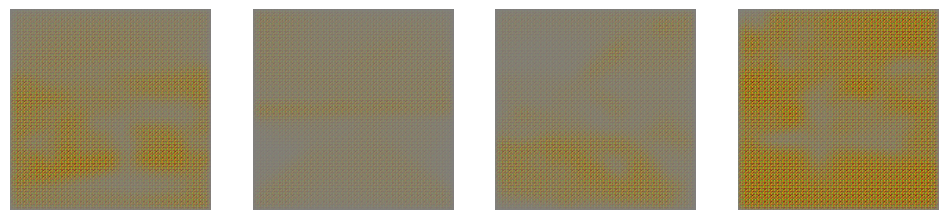

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


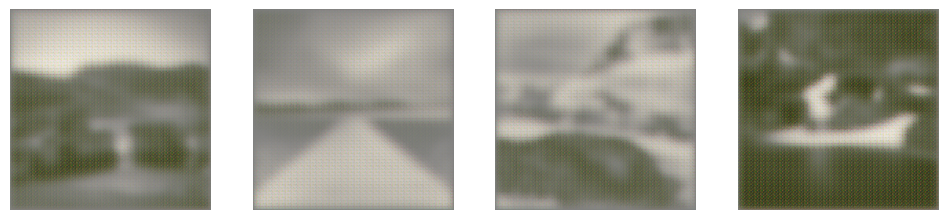

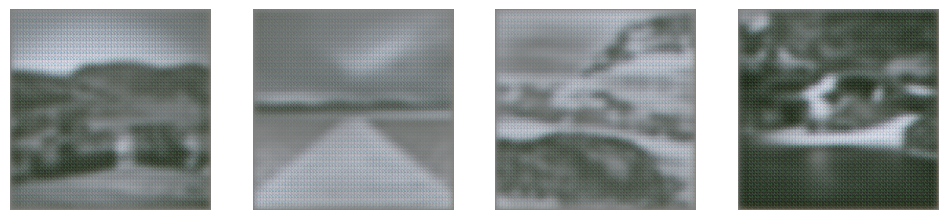

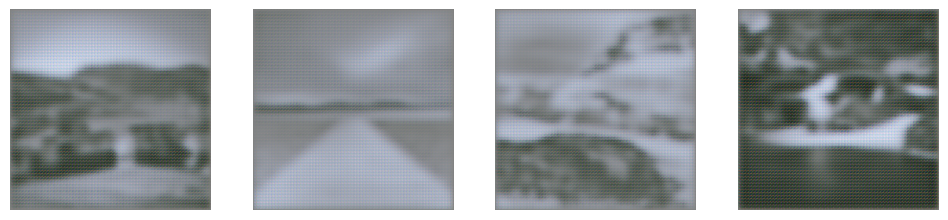

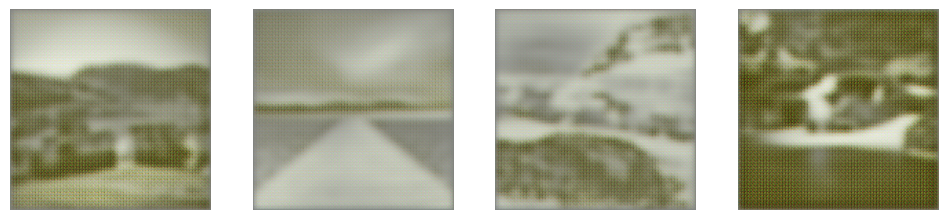

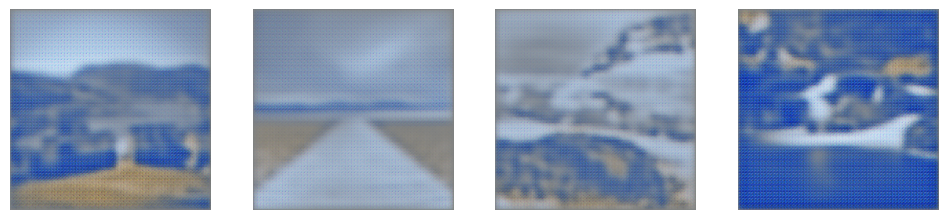

...

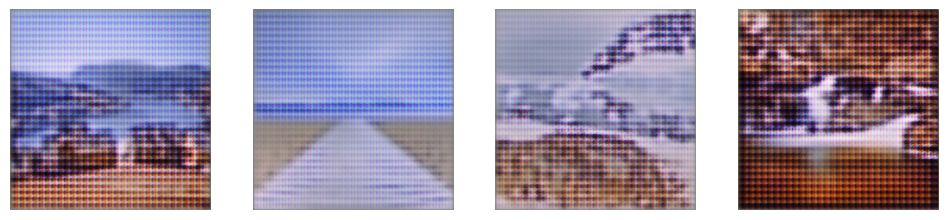

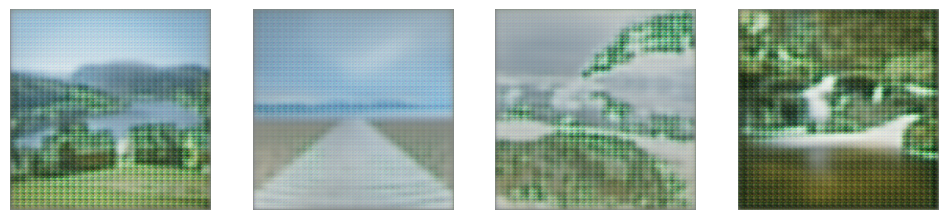

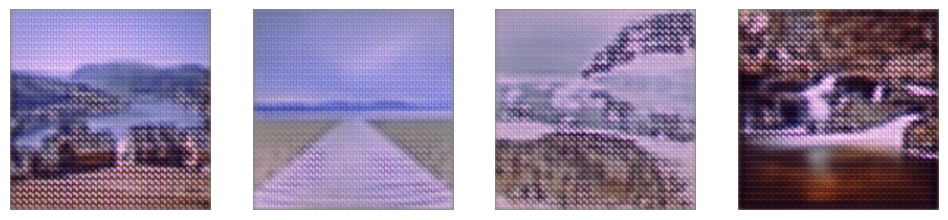

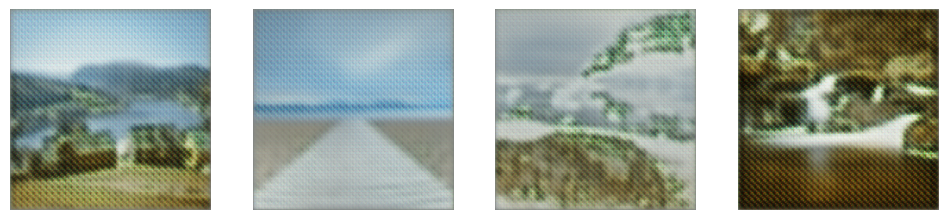

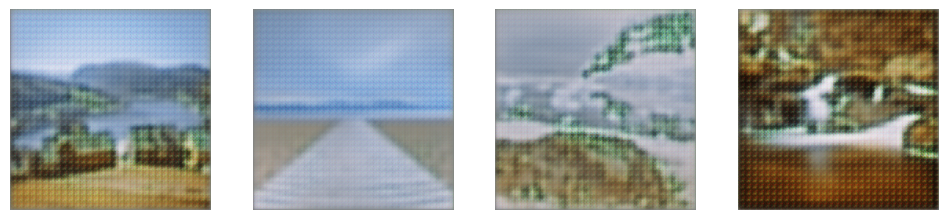

In [ ]:
EPOCHS = 100
for epoch in range(EPOCHS):
    for photo, monet in tf.data.Dataset.zip((photo_dataset, monet_dataset)):
        train_step(photo, monet, generator_g, generator_f, discriminator_x, discriminator_y,
                   generator_g_optimizer, generator_f_optimizer, discriminator_x_optimizer, discriminator_y_optimizer)
    # Save generated images to visualize progress
    if epoch % 5 == 0 or epoch == EPOCHS - 1:  # Save images every 5 epochs
        generate_and_save_images(generator_g, epoch, sample_photos[:NUM_SAMPLES])
        generator_g.save('generator_g_model_{}.h5'.format(epoch))

In [ ]:
ls

gan-getting-started.zip  generator_g_model_5.h5   image_at_epoch_0010.png  image_at_epoch_0070.png
generator_g_model_0.h5   generator_g_model_60.h5  image_at_epoch_0015.png  image_at_epoch_0075.png
generator_g_model_10.h5  generator_g_model_65.h5  image_at_epoch_0020.png  image_at_epoch_0080.png
generator_g_model_15.h5  generator_g_model_70.h5  image_at_epoch_0025.png  image_at_epoch_0085.png
generator_g_model_20.h5  generator_g_model_75.h5  image_at_epoch_0030.png  image_at_epoch_0090.png
generator_g_model_25.h5  generator_g_model_80.h5  image_at_epoch_0035.png  image_at_epoch_0095.png
generator_g_model_30.h5  generator_g_model_85.h5  image_at_epoch_0040.png  image_at_epoch_0099.png
generator_g_model_35.h5  generator_g_model_90.h5  image_at_epoch_0045.png  monet_jpg/
generator_g_model_40.h5  generator_g_model_95.h5  image_at_epoch_0050.png  monet_tfrec/
generator_g_model_45.h5  generator_g_model_99.h5  image_at_epoch_0055.png  photo_jpg/
generator_g_model_50.h5  image_at_epoch_0000.pn

In [ ]:
generator_g = tf.keras.models.load_model('generator_g_model_99.h5')

In [ ]:
def preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.io.decode_jpeg(image)
    image = tf.image.resize(image, [256, 256])
    image = (tf.cast(image, tf.float32) / 127.5) - 1  # Normalize to [-1, 1]
    image = tf.expand_dims(image, 0)  # Add batch dimension
    return image

In [ ]:
photo_directory = '/content/photo_jpg'
output_directory = 'converted'
os.makedirs(output_directory, exist_ok=True)

for filename in os.listdir(photo_directory):
    if filename.endswith(".jpg"):
        image_path = os.path.join(photo_directory, filename)
        input_image = preprocess_image(image_path)
        transformed_image = generator_g.predict(input_image)
        transformed_image = (transformed_image + 1) * 127.5  # Denormalize to [0, 255]
        transformed_image = tf.squeeze(transformed_image).numpy().astype(np.uint8)  # Remove batch dimension and convert to uint8

        # Save the transformed image
        output_path = os.path.join(output_directory, 'monet_' + filename)
        tf.keras.preprocessing.image.save_img(output_path, transformed_image)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 21ms/step


In [ ]:
ls "converted"

monet_00068bc07f.jpg  monet_3d70ef0d7c.jpg  monet_7c6cf5181a.jpg  monet_bf36a527ab.jpg
monet_000910d219.jpg  monet_3d71b5934b.jpg  monet_7c79a1e83e.jpg  monet_bf3ece26c1.jpg
monet_000ded5c41.jpg  monet_3d8835b84d.jpg  monet_7c872ca222.jpg  monet_bf6062190e.jpg
monet_00104fd531.jpg  monet_3d89a7a1c4.jpg  monet_7c955126e8.jpg  monet_bf61f9adb1.jpg
monet_001158d595.jpg  monet_3d89fa1a08.jpg  monet_7c9a4f10b2.jpg  monet_bf6ed52f2c.jpg
monet_0033c5f971.jpg  monet_3d8fd794f8.jpg  monet_7c9af80795.jpg  monet_bf72b298bc.jpg
monet_0039ebb598.jpg  monet_3d961be033.jpg  monet_7cb0522881.jpg  monet_bf7b0e4b1f.jpg
monet_003aab6fdd.jpg  monet_3da4c699b8.jpg  monet_7cb0db442a.jpg  monet_bf8f3d28ae.jpg
monet_003c6c30e0.jpg  monet_3db43d9a04.jpg  monet_7cb82fa990.jpg  monet_bf918a456c.jpg
monet_00479e2a21.jpg  monet_3db8bf2299.jpg  monet_7cbf0363dd.jpg  monet_bf94cca435.jpg
monet_005f987f56.jpg  monet_3dc62c7550.jpg  monet_7cc41853c4.jpg  monet_bf964262b6.jpg
monet_0080f94ebc.jpg  monet_3dc69fb234.jpg 

In [ ]:
!zip -r images.zip converted

Streaming output truncated to the last 5000 lines.
  adding: converted/monet_06c89c4c23.jpg (deflated 8%)
  adding: converted/monet_fe702a794e.jpg (deflated 54%)
  adding: converted/monet_b469541ab9.jpg (deflated 9%)
  adding: converted/monet_77573ba17e.jpg (deflated 7%)
  adding: converted/monet_5b960d2105.jpg (deflated 8%)
  adding: converted/monet_159baa9c2b.jpg (deflated 8%)
  adding: converted/monet_d725fc1f6c.jpg (deflated 15%)
  adding: converted/monet_76354e710e.jpg (deflated 6%)
  adding: converted/monet_174f0355a6.jpg (deflated 19%)
  adding: converted/monet_de6510a7ab.jpg (deflated 11%)
  adding: converted/monet_2d48369700.jpg (deflated 7%)
  adding: converted/monet_634246cbc0.jpg (deflated 12%)
  adding: converted/monet_d96e82c6f6.jpg (deflated 14%)
  adding: converted/monet_9ea60e0936.jpg (deflated 10%)
  adding: converted/monet_21b9aafc49.jpg (deflated 12%)
  adding: converted/monet_3023c7e91c.jpg (deflated 20%)
  adding: converted/monet_d4844e2dad.jpg (deflated 36%)
  ad

In [ ]:
from IPython.display import FileLink
FileLink(r'images.zip')

/content/images.zip

1/1 [==============================] - 0s 108ms/step


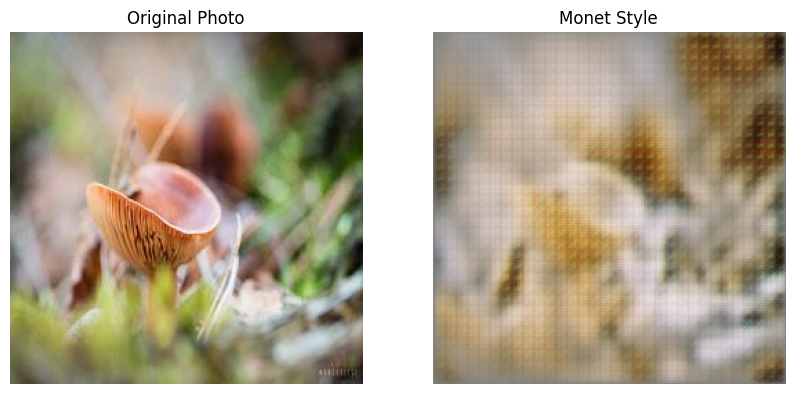

In [ ]:
def preprocess_image(image_path):
    img = image.load_img(image_path, target_size=(256, 256))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = (img / 127.5) - 1.0  # Normalize to the range [-1, 1]
    return img

generator_g = tf.keras.models.load_model('/content/generator_g_model_99.h5')
photo_image_path = '/content/photo_jpg/0033c5f971.jpg'
input_image = preprocess_image(photo_image_path)
transformed_image = generator_g.predict(input_image)
transformed_image = (transformed_image + 1.0) * 127.5
transformed_image = np.clip(transformed_image, 0, 255)
original_image = image.load_img(photo_image_path)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Photo')
plt.imshow(original_image)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.title('Monet Style')
plt.imshow(transformed_image[0].astype(np.uint8))
plt.axis('off')
plt.show()

In [ ]:
#my_notes https://chat.openai.com/c/3880ab9a-261c-4af6-98f8-4bf86c7fde05